In [1]:
import pandas as pd

In [80]:
# fragment from miscellaneous
# can be replaced by 'from ... import voigt_'
from numpy import sqrt, log
from torch import square_, exp_

width_sigma = 2 * sqrt(log(2))  # * np.sqrt(2)
width_lambda = 2.

def gauss_(x, amp, w, mu, sum=True):
    n = amp.size(0)
    sigma = w / width_sigma
    t = x.repeat(n, 1).sub_(mu[:, None])
    t.div_(sigma[:, None])
    t = exp_(square_(t).neg_())
    t.mul_(amp[:, None])
    if sum:
        t = t.sum(0)
    return t

def lorentz_(x, amp, w, x0, sum=True):
    n = amp.size(0)
    t = x.repeat(n, 1)
    t.sub_(x0[:, None])
    t.mul_(width_lambda)
    t.div_(w[:, None])
    t = square_(t)
    t.add_(1)
    t = amp[:, None].div(t)
    if sum:
        t = t.sum(0)
    return t

def voigt_(x, amp, w, x0, gau, sum=True):
    res = lorentz_(x, amp, w, x0, False).mul_(1 - gau[:, None]).add_(gauss_(x, amp, w, x0, False).mul_(gau[:, None]))
    if sum:
        res = res.sum(0)
    return res

In [56]:
import numpy as np
import random
from torch import tensor

# по хорошему надо иметь возможность задавать границы как параметры

class GeneticAlgorithm:
    def __init__(self, pop_size, generations, mutation_rate, target_x, target_y, num_peaks, tournament_size, curve_func, mutation_bound):
        self.pop_size = pop_size #int
        self.generations = generations #int
        self.mutation_rate = mutation_rate #float 0 <= mr <=1
        self.target_x = target_x # array of float
        self.target_y = target_y # array of float
        self.num_peaks = num_peaks # int
        self.tournament_size = tournament_size #int ts < pop_size
        self.mutation_bound = mutation_bound # dict {'x0': float, 'ws': float, 'amp': float, 'gau': float}
        self.curve_func = curve_func # spec function from module "miscellaneous"

    def get_curve_from_chromosome(self, chromosome):
        x0 = chromosome[:self.num_peaks]
        ws = chromosome[self.num_peaks:self.num_peaks * 2]
        amp = chromosome[self.num_peaks * 2:self.num_peaks * 3]
        gau = chromosome[self.num_peaks * 3:self.num_peaks * 4]
        
        x_ = tensor(self.target_x)
        x0_= tensor(x0)
        ws_ = tensor(ws)
        amp_ = tensor(amp)
        gau_ = tensor(gau)

        return self.curve_func(x_, amp_, ws_, x0_, gau_, True)

    def fitness(self, chromosome):
        approx = self.get_curve_from_chromosome(chromosome)
        mse = np.square(approx - self.target_y).mean()
        return -float(mse)

    def generate_population(self):
        population = []
        for _ in range(self.pop_size):
            chromosome = []
            chromosome.append(np.random.randint(-10, 10, self.num_peaks)) # x0
            chromosome.append(np.random.uniform(0.2, 2.5, self.num_peaks)) # ws
            chromosome.append(np.random.normal(0.1, 10, self.num_peaks)) # amp
            chromosome.append(np.random.uniform(0, 1, self.num_peaks)) # gau
            chromosome = np.array(chromosome).reshape((-1, 1)).T[0]
            chromosome = chromosome.tolist()
            population.append(chromosome)

        return population

    def select_parent_tournament(self, population):
        tournament = random.sample(population, self.tournament_size)
        return max(tournament, key=lambda x: self.fitness(x))

    def crossover(self, parent1, parent2):
        crossover_point = random.randint(1, len(parent1) - 1)
        child1 = parent1[:crossover_point] + parent2[crossover_point:]
        child2 = parent2[:crossover_point] + parent1[crossover_point:]
        return child1, child2

    def mutate(self, chromosome):
        for i in range(len(chromosome)):
                if random.random() < self.mutation_rate:
                    if i < self.num_peaks:
                        bound = self.mutation_bound['x0']
                    elif self.num_peaks <= i < 2*self.num_peaks:
                        bound = self.mutation_bound['ws']
                    elif 2*self.num_peaks <= i < 3*self.num_peaks:
                        bound = self.mutation_bound['amp']
                        #bound1 = self.mutation_bound['amp']
                        #bound2 = self.mutation_bound['amp']
                    elif 3*self.num_peaks <= i < 4*self.num_peaks:
                        bound = self.mutation_bound['gau']
                    chromosome[i] += random.uniform(-bound, bound)
        return chromosome

    def run(self):
        population = self.generate_population()
        history = []
        for generation in range(self.generations):
            #if generation%10 == 0:
            print("Generation:", generation + 1)
            new_population = []
            for _ in range(self.pop_size // 2):
                parent1 = self.select_parent_tournament(population)
                parent2 = random.choice(population)
                child1, child2 = self.crossover(parent1, parent2)
                child1 = self.mutate(child1)
                child2 = self.mutate(child2)
                new_population.extend([child1, child2])
            
            population = new_population
            population.sort(key=lambda x: self.fitness(x), reverse=True)
            best_individual = population[0]
            best_fitness = self.fitness(best_individual)
            history.append(best_fitness)
            print("Best Fitness:", best_fitness)
            print("Best Individual (Coefficients):", best_individual)
            print()
        return best_individual, best_fitness, history

# 1nd toy spectra

In [61]:
# игрушечный спектр
# важен порядок параметров
x = np.linspace(-10, 10, 1000)
x0 = np.array([1, 5, -9, -1, 9])
ws = np.array([0.5, 1, 0.5, 2, 0.25])
amp = np.array([1, 4, 6, 9, 0.8])
gau = np.array([0.5, .5, 1, 0, 0.25])

true_chromosome = np.array([x0, ws, amp, gau]).reshape((-1,1))
true_chromosome = true_chromosome.tolist()

x_ = tensor(x)
x0_= tensor(x0)
ws_ = tensor(ws)
amp_ = tensor(amp)
gau_ = tensor(gau)
true_curve = voigt_(x_, amp_, ws_, x0_, gau_, True)

POPULATION_SIZE = 150
GENERATIONS = 300
MUTATION_RATE = 0.08
TARGET_X = x
TARGET_Y = true_curve
TOURNAMENT_SIZE = 40 #POPULATION_SIZE // 5
NUM_PEAKS = 5
CURVE_FUNC = voigt_
MUTATION_BOUNDARIES = {'x0': 1., 'ws': 0.2, 'amp': 0.1, 'gau': 0.01}
# TO DO
#POPULATION_INIT_BOUND = {'x0': {left: 1.,
#                         'ws': 0.2, 'amp': 0.1, 'gau': 0.01}

#chromosome.append(np.random.randint(-10, 10, self.num_peaks)) # x0
#chromosome.append(np.random.uniform(0.2, 2.5, self.num_peaks)) # ws
#chromosome.append(np.random.normal(0.1, 10, self.num_peaks)) # amp
#chromosome.append(np.random.uniform(0, 1, self.num_peaks)) # gau

In [59]:
ga = GeneticAlgorithm(POPULATION_SIZE, GENERATIONS, MUTATION_RATE, TARGET_X, TARGET_Y, NUM_PEAKS, TOURNAMENT_SIZE, CURVE_FUNC, MUTATION_BOUNDARIES)
best_individual, best_fitness, history = ga.run()

Generation: 1
Best Fitness: -2.107700852995414
Best Individual (Coefficients): [-1.0, 1.0, -1.0, -6.0, -4.0, 1.069803115126572, 0.8603088056759933, 2.1862052585932688, 0.5906569432724958, 0.21743380701306378, 4.128743219467486, 5.9660050105868985, 6.345271746125337, 0.053394135202277995, 2.7377078717600773, 0.5555431575763026, 0.5596971539691917, 0.9011649497338483, 0.7791505025417133, 0.11362748616283047]

Generation: 2
Best Fitness: -2.1096415230933037
Best Individual (Coefficients): [-1.0, 1.0, -1.0, -6.0, -4.0, 1.069803115126572, 0.8603088056759933, 2.1862052585932688, 0.5906569432724958, 0.21743380701306378, 4.128743219467486, 5.9660050105868985, 6.345271746125337, 0.053394135202277995, 2.7377078717600773, 0.5555431575763026, 0.6546801006480828, 0.7888626305053388, 0.34033374677622996, 0.17133048427969988]

Generation: 3
Best Fitness: -1.8948015064486625
Best Individual (Coefficients): [-1.0, 1.5673295882242733, -1.0, -6.0, -4.0, 1.069803115126572, 0.8603088056759933, 2.1862052585

In [79]:
def get_voigt_from_chromosome(chromosome, x, num_peaks):
    x0 = chromosome[:num_peaks]
    ws = chromosome[num_peaks:num_peaks * 2]
    amp = chromosome[num_peaks * 2:num_peaks * 3]
    gau = chromosome[num_peaks * 3:num_peaks * 4]
    x_ = tensor(x)
    x0_= tensor(x0)
    ws_ = tensor(ws)
    amp_ = tensor(amp)
    gau_ = tensor(gau)
    return voigt_(x_, amp_, ws_, x0_, gau_, True)

<function matplotlib.pyplot.show(close=None, block=None)>

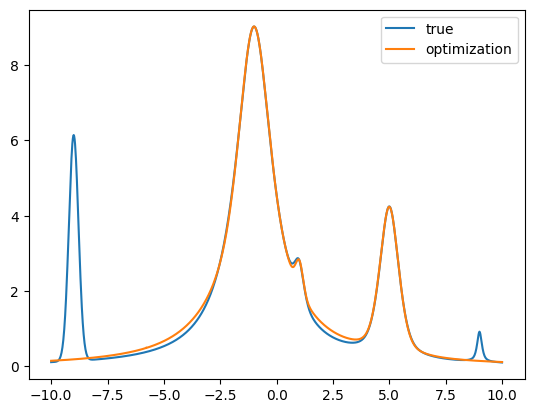

In [60]:
import matplotlib.pyplot as plt

optim_curve = get_voigt_from_chromosome(best_individual, TARGET_X, NUM_PEAKS)
plt.plot(TARGET_X, true_curve, label='true')
plt.plot(TARGET_X, optim_curve, label='optimization')
plt.legend()
plt.show

## Цикл

In [62]:
MSEs = []
params = []
histories = []

for i in range(20):
    print('Iteration', i)
    ga = GeneticAlgorithm(POPULATION_SIZE, GENERATIONS, MUTATION_RATE, TARGET_X, TARGET_Y, NUM_PEAKS, TOURNAMENT_SIZE, CURVE_FUNC, MUTATION_BOUNDARIES)
    best_individual, best_fitness, history = ga.run()
    MSEs.append(best_fitness)
    params.append(best_individual)
    histories.append(history)

Iteration 0
Generation: 1
Best Fitness: -1.9098225506543425
Best Individual (Coefficients): [-5.0, -1.0, -7.0, -7.0, 9.0, 0.43513319020750085, 1.8413112592389813, 1.3886305130963599, 1.655990477464454, 0.8102886207771784, -1.4273944738433497, 10.249381045566542, 1.5110541772064845, -0.9517296009919468, -2.2346736569681793, 0.3382451354097987, 0.5550600678666517, 0.32603636918704104, 0.8100586520548013, 0.4431726582340697]

Generation: 2
Best Fitness: -1.4470162693581334
Best Individual (Coefficients): [-5.0, -1.0, -7.0, -7.069318932748867, 9.0, 0.43513319020750085, 1.9603094254794766, 1.3886305130963599, 1.655990477464454, 0.8102886207771784, -1.4273944738433497, 10.249381045566542, 1.5110541772064845, -0.9888583542933496, -0.28101650258432864, 0.6565875295095298, 0.07501187728421033, 0.14702206071697707, 0.29682489650305954, 0.5415433694673222]

Generation: 3
Best Fitness: -1.3480622172025252
Best Individual (Coefficients): [-5.0, -1.0, -7.0, -5.2449067347367055, -9.0, 0.4351331902075

In [63]:
MSEs

[-0.5630838690042119,
 -0.013353642919220836,
 -0.6873811715255106,
 -0.012767463881745213,
 -0.42570711193212407]

In [64]:
MSEs = [-0.5630838690042119,
        -0.013353642919220836,
        -0.6873811715255106,
        -0.012767463881745213,
        -0.42570711193212407,
        -0.013321134085712248,
        -0.6863710863743473,
        -0.016683643412899383,
        -0.2648814555329003,
        -0.025425363116566783,
        -0.6802754974688571,
        -0.6595923795742771,
        -0.4798587512451112,
        -0.06133269212550434,
        -0.02333227494730064,
        -0.6884454418204998,
        -0.8181652699385817,
        -0.006163621506981459,
        -0.01577495526969553,
        -0.4444836880192919]

In [65]:
#pd.DataFrame(MSEs).to_csv('MSE_better.csv')
#pd.DataFrame(params).to_csv('params_5_1.csv')
#pd.DataFrame(histories).to_csv('history_5_1.csv')

In [ ]:
params = pd.read_csv('params_ga_small.csv')
params = params.drop(['Unnamed: 0'], axis=1)
#params.head(1)
params = params.to_numpy()
#params

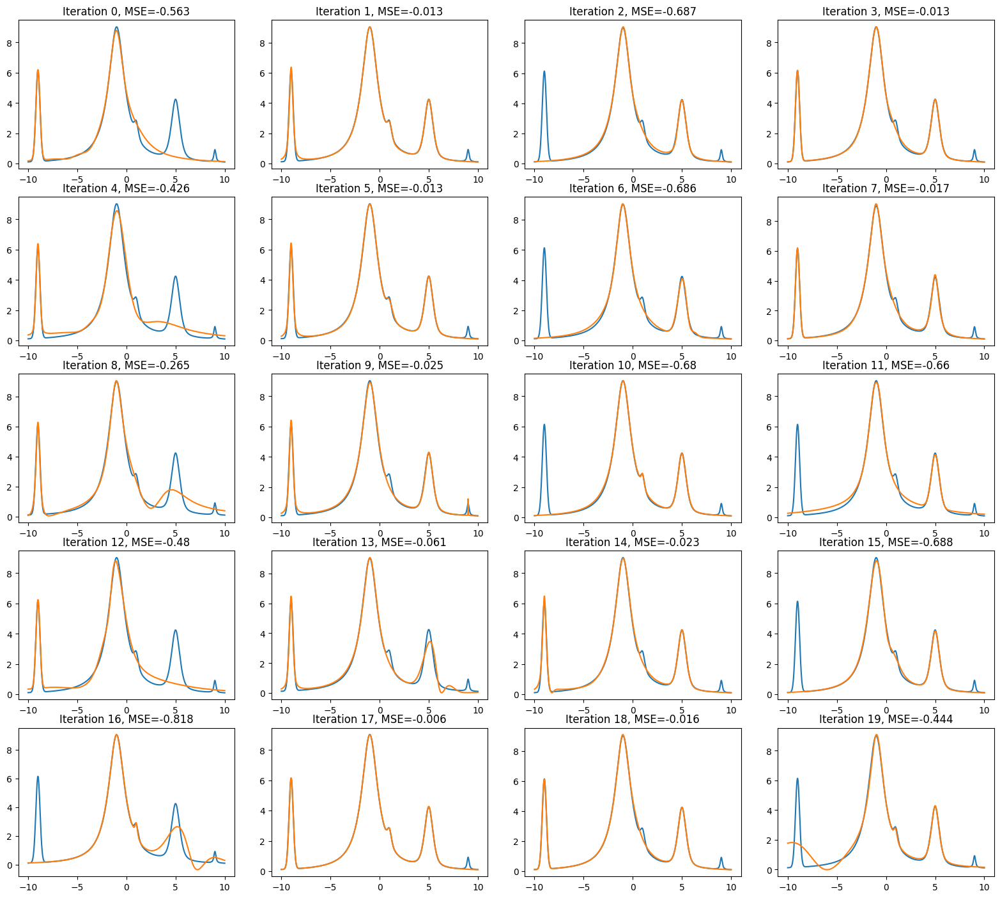

In [77]:
########## new & good #############
import matplotlib.pyplot as plt
# 20 запусков алгоритма при POP_SIZE = 120, N_GEN = 250, MUT_RATE = 0.08, TOURN = 30, NUM_PEAKS = 5
# Execution Time 63m 22.0s
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 14))
fig.tight_layout()
m = 0
for i in range(5):
    for j in range(4):
        optim_curve = get_voigt_from_chromosome(params[m], TARGET_X, NUM_PEAKS)
        ax[i, j].plot(TARGET_X, true_curve, label='true')
        ax[i, j].plot(TARGET_X, optim_curve, label='optimization')
        ax[i, j].set_title(f'Iteration {m}, MSE={round(MSEs[m], 3)}', fontsize=12)
        #ax.legend()
        m = m + 1
#plt.legend()
#fig.suptitle('20 запусков алгоритма при POP_SIZE = 120, N_GEN = 250, MUT_RATE = 0.08, TOURN = 30, NUM_PEAKS = 5)
plt.show()

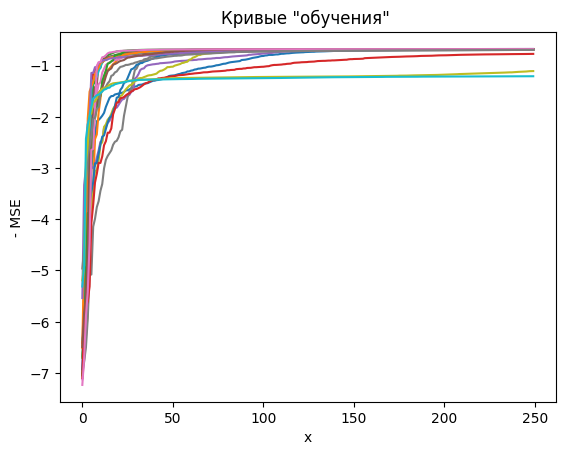

In [29]:
fig, ax = plt.subplots() 
for i in range(20):
    ax.plot(range(GENERATIONS), histories[i])
    ax.set_ylabel('- MSE')
    ax.set_xlabel('x')
plt.title('Кривые "обучения" ')
plt.show()

# 2nd toy spectra

In [ ]:
# игрушечный спектр
# важен порядок параметров
x = np.linspace(-10, 10, 1000)
x0= np.array([-10, 0, -4,  -4.5, 7.1, 7.2, 5, -9, -1, 9, 9.5, 9.1, 8.3, 6.6666, 5.432])
ws = np.array([0.5, 1, 0.5, 2, 0.25, 10, 2.3, 4.8, 1., 1., 1., 0.1, 0.01, 6, 7.7])
amp = np.array([1, 4, 6, 9, 0.8, 
                    0.1, 0.9, 2.4, 4.4, 0.4,
                    9.1, 7.7, 4.0, 4.0, 9.8])
gau = np.array([0.5, .5, 1, 0, 0.25,
                    0.55, 0.67, 0.67, 1., 1.,
                      0., 0.02, 0.2, 0.48, .33])

true_chromosome = np.array([x0, ws, amp, gau]).reshape((-1,1))
true_chromosome = true_chromosome.tolist()

x_ = tensor(x)
x0_= tensor(x0)
ws_ = tensor(ws)
amp_ = tensor(amp)
gau_ = tensor(gau)
true_curve = voigt_(x_, amp_, ws_, x0_, gau_, True)

POPULATION_SIZE = 120
GENERATIONS = 200
MUTATION_RATE = 0.08
TARGET_X = x
TARGET_Y = true_curve
TOURNAMENT_SIZE = 24 #POPULATION_SIZE // 5
NUM_PEAKS = 15
CURVE_FUNC = voigt_
MUTATION_BOUNDARIES = {'x0': 1., 'ws': 0.2, 'amp': 0.1, 'gau': 0.01}

In [ ]:
MSEs_15 = []
params_15 = []
histories_15 = []

for i in range(20):
    print('Iteration', i)
    ga = GeneticAlgorithm(POPULATION_SIZE, GENERATIONS, MUTATION_RATE, TARGET_X, TARGET_Y, NUM_PEAKS, TOURNAMENT_SIZE, CURVE_FUNC, MUTATION_BOUNDARIES)
    best_individual, best_fitness, history = ga.run()
    MSEs_15.append(best_fitness)
    params_15.append(best_individual)
    histories_15.append(history)

Iteration 0
Generation: 1
Best Fitness: -25.026597317365347
Best Individual (Coefficients): [3.0, 8.0, 5.0, 8.0, 4.0, 6.0, -10.0, -1.0, -3.0, -10.0, 9.0, 8.0, -2.0, -6.0, -2.0, 1.0276149714333727, 2.6666905006582127, 6.635320747448367, 2.943365204883066, 2.4615521886251357, 3.2724189389709406, 6.286499825332548, 0.850672244018841, 6.532025874979591, 6.04681795140441, 6.279049660393302, 9.7117895139786, 3.7641552515764385, 6.647770539000364, 8.680446762805385, -4.781829249341571, 0.25279190508285276, 2.2849011277865015, 12.748776526792183, -1.5500594923480384, 6.597242907967119, 3.621842913889918, 15.493132577045145, 4.490249435285987, 2.8394771144269297, 0.285922155902712, 4.405635846953174, -2.252312641096991, -6.729029493474389, 4.977316182737895, 0.026877097543793194, 0.5084067883928786, 0.3763709700509938, 0.47824769113671695, 0.7920769271121509, 0.32778154976234475, 0.5040705389838038, 0.9585273305929065, 0.7340756908995207, 0.15737305735129226, 0.19110079801237811, 0.829599501200

In [ ]:
pd.DataFrame(MSEs_15).to_csv('MSE_2nd_toy_15_peaks.csv')
pd.DataFrame(params_15).to_csv('params_2nd_toy_15_peaks.csv')
pd.DataFrame(histories_15).to_csv('history_2nd_toy_15_peaks.csv')

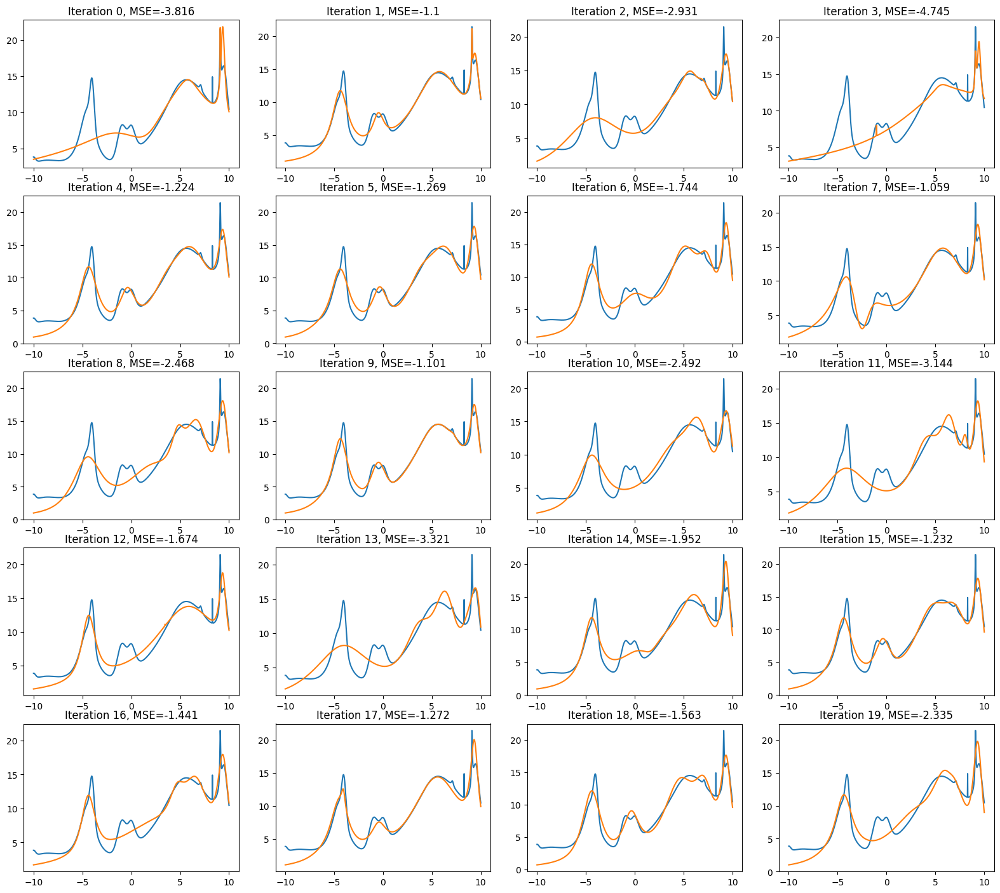

In [ ]:
# 5 peaks
import matplotlib.pyplot as plt
# 20 запусков алгоритма при POP_SIZE = 100, N_GEN = 300, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15

fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 14))
fig.tight_layout()
m = 0
for i in range(5):
    for j in range(4):
        optim_curve = get_voigt_from_chromosome(params[m], TARGET_X, NUM_PEAKS)
        ax[i, j].plot(TARGET_X, true_curve, label='true')
        ax[i, j].plot(TARGET_X, optim_curve, label='optimization')
        ax[i, j].set_title(f'Iteration {m}, MSE={round(MSEs[m], 3)}', fontsize=12)
        #ax.legend()
        m = m + 1
#plt.legend()
#fig.suptitle('20 запусков алгоритма при POP_SIZE = 100, N_GEN = 300, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15')
plt.show()

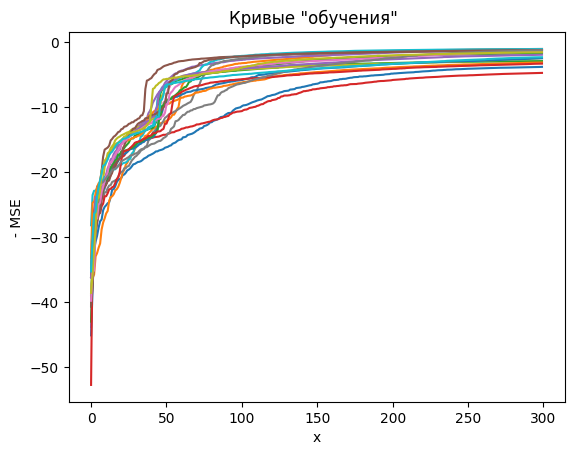

In [ ]:
fig, ax = plt.subplots() 
for i in range(20):
    ax.plot(range(GENERATIONS), histories[i])
    ax.set_ylabel('- MSE')
    ax.set_xlabel('x')
plt.title('Кривые "обучения" ')
plt.show()

После 200 все сходятся.

### pohui potom

In [82]:
mse_ga = pd.read_csv('../data/results/mse/medium/mse_ga_medium.csv')
mse_ga = mse_ga['0']
mse_ga = -(mse_ga.to_numpy())/400 # шкалирую мои mse к тем, которые у леона в fish

In [84]:
params_ga = pd.read_csv('../data/maxim_data/params_2nd_toy_15_peaks.csv')
params_ga.head(1)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,50,51,52,53,54,55,56,57,58,59
0,0,6.441559,8.579491,5.163852,7.097096,4.24075,6.079672,-6.747603,0.162981,-2.418,...,0.035582,0.373695,0.812516,0.657171,0.160777,0.187278,0.802989,0.804518,0.217239,0.889213


In [85]:
params_ga = params_ga['0']
params_ga = (params_ga.to_numpy())/20 # шкалирую

In [ ]:
# 15 peaks
# 20 запусков алгоритма при POP_SIZE = 120, N_GEN = 200, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15
# SCALED TO 0 1 
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 14))
fig.tight_layout()
m = 0
for i in range(5):
    for j in range(4):
        optim_curve = get_voigt_from_chromosome(params_15[m], TARGET_X, NUM_PEAKS)
        ax[i, j].plot(TARGET_X, true_curve, label='true')
        ax[i, j].plot(TARGET_X, optim_curve, label='optimization')
        ax[i, j].set_title(f'Iteration {m}, MSE={round(MSEs_15[m], 3)}', fontsize=12)
        #ax.legend()
        m = m + 1
#plt.legend()
#fig.suptitle('20 запусков алгоритма при POP_SIZE = 120, N_GEN = 200, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15')
plt.show()

### medium spectra 15 peaks plot 

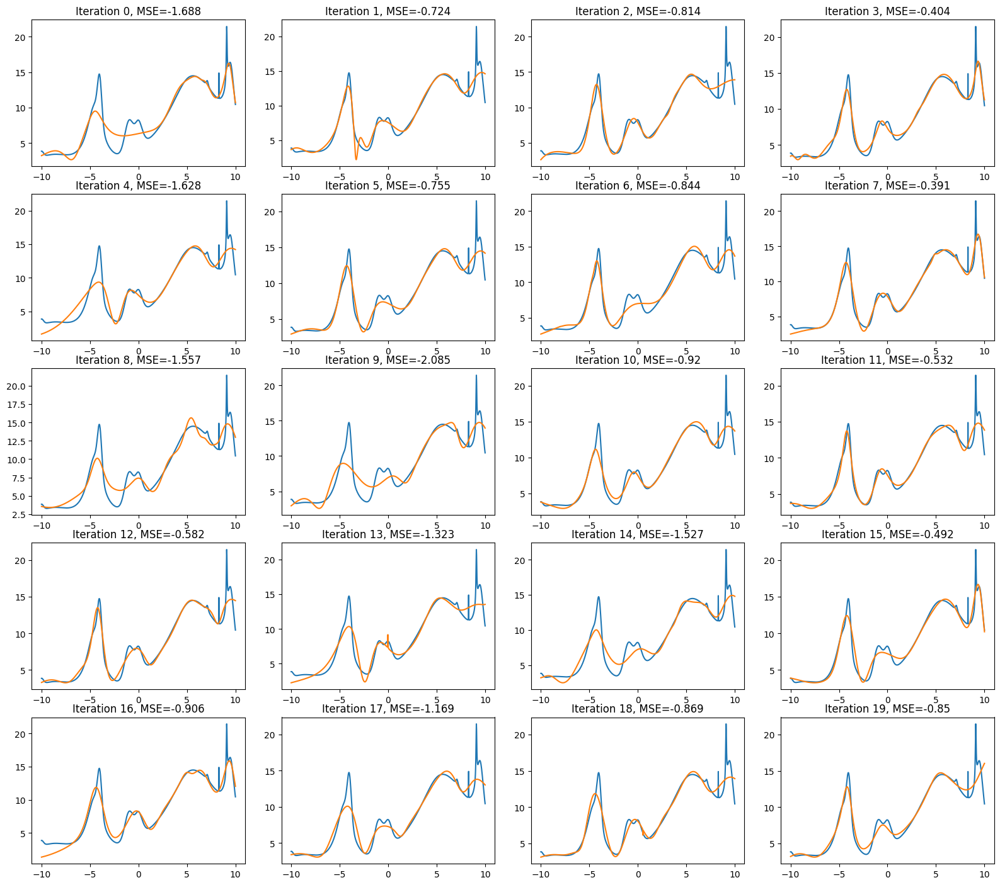

In [ ]:
# 15 peaks
# 20 запусков алгоритма при POP_SIZE = 120, N_GEN = 200, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15

fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 14))
fig.tight_layout()
m = 0
for i in range(5):
    for j in range(4):
        optim_curve = get_voigt_from_chromosome(params_15[m], TARGET_X, NUM_PEAKS)
        ax[i, j].plot(TARGET_X, true_curve, label='true')
        ax[i, j].plot(TARGET_X, optim_curve, label='optimization')
        ax[i, j].set_title(f'Iteration {m}, MSE={round(MSEs_15[m], 3)}', fontsize=12)
        #ax.legend()
        m = m + 1
#plt.legend()
#fig.suptitle('20 запусков алгоритма при POP_SIZE = 120, N_GEN = 200, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15')
plt.show()

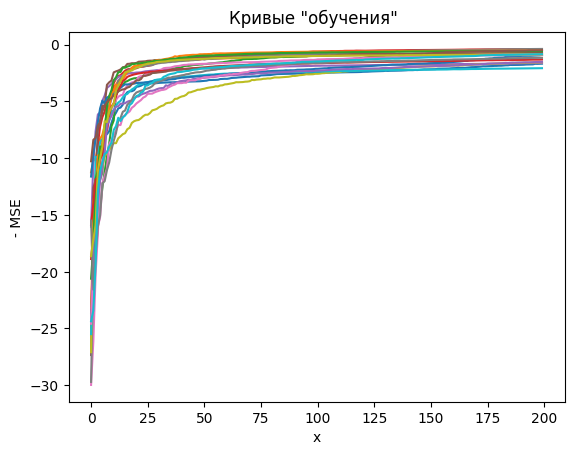

In [ ]:
fig, ax = plt.subplots() 
for i in range(20):
    ax.plot(range(GENERATIONS), histories_15[i])
    ax.set_ylabel('- MSE')
    ax.set_xlabel('x')
plt.title('Кривые "обучения" ')
plt.show()

# Real spectra

In [4]:
data = pd.read_csv('../data/maxim_data/spectra_data.csv')
x = pd.read_csv('../data/maxim_data/spectra_wavenums.csv')

In [7]:
data = data['0'].to_numpy()
#x = x['0'].to_numpy()
#x

<function matplotlib.pyplot.show(close=None, block=None)>

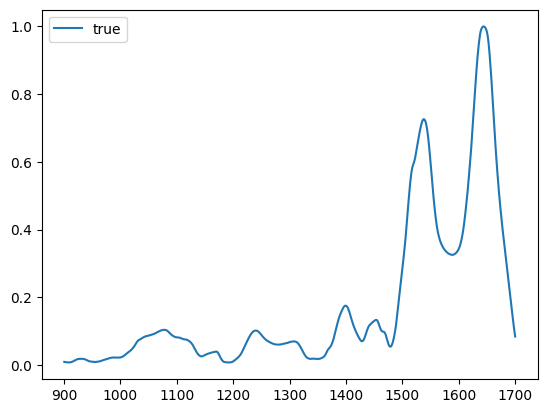

In [14]:
import matplotlib.pyplot as plt

plt.plot(x, data, label='true')
plt.legend()
plt.show

In [49]:
POPULATION_SIZE = 120
GENERATIONS = 250
MUTATION_RATE = 0.08
TARGET_X = x
TARGET_Y = data
TOURNAMENT_SIZE = 30 #POPULATION_SIZE // 5
NUM_PEAKS = 15
CURVE_FUNC = voigt_
MUTATION_BOUNDARIES = {'x0': 50., 'ws': 7., 'amp': 0.07, 'gau': 0.01}

#np.random.randint(900, 1700, self.num_peaks)) # x0
#np.random.uniform(0.5, 40, self.num_peaks)) # ws
#np.random.normal(0.05, 1, self.num_peaks)) # amp
#np.random.uniform(0, 1, self.num_peaks)) # gau

In [45]:
ga = GeneticAlgorithm(POPULATION_SIZE, GENERATIONS, MUTATION_RATE, TARGET_X, TARGET_Y, NUM_PEAKS, TOURNAMENT_SIZE, CURVE_FUNC, MUTATION_BOUNDARIES)
best_individual, best_fitness, history = ga.run()

Generation: 1
Best Fitness: -0.12668419859599842
Best Individual (Coefficients): [1019.0, 1440.7596650384314, 1004.0, 1108.0, 1204.0, 998.0, 1168.0, 904.0, 1694.0, 1421.0, 1366.0, 933.0, 1629.0, 1475.0, 996.0, 59.41272215961266, 51.40390609426612, 50.090286059697206, 7.895997525576417, 86.02755448044958, 88.22744104681212, 10.401062831171489, 35.64906349068549, 65.94465336797488, 34.03940004207624, 49.22712019838812, 54.04083324135866, 44.599532206008384, 99.55316686658405, 31.798296548995918, 0.8869943412649934, 0.9651993645833994, 1.2185859548373768, -1.1574462777658818, -0.16173410297177226, -0.5219687979470672, -0.12361161818667331, 0.24384495214843882, 0.6724866574012525, -1.118964872801531, 0.09337719926528251, -0.6292288547822777, 0.9592360396232283, -0.09497878332590208, -0.9787128188723591, 0.1874319497344099, 0.011541002151771007, 0.759310282953033, 0.16486578876874358, 0.022057959656281323, 0.21996166404402606, 0.10126631953841525, 0.4569829331596804, 0.8078903652851629, 0.5

<function matplotlib.pyplot.show(close=None, block=None)>

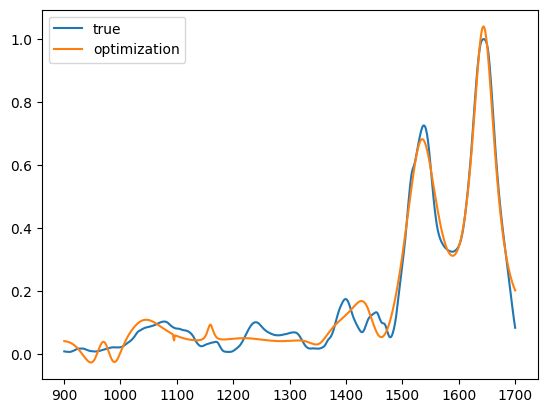

In [46]:
import matplotlib.pyplot as plt

optim_curve = get_voigt_from_chromosome(best_individual, TARGET_X, NUM_PEAKS)
plt.plot(TARGET_X, data, label='true')
plt.plot(TARGET_X, optim_curve, label='optimization')
plt.legend()
plt.show

In [50]:
MSEs_real = []
params_real = []
histories_real = []

for i in range(20):
    print('Iteration', i)
    ga = GeneticAlgorithm(POPULATION_SIZE, GENERATIONS, MUTATION_RATE, TARGET_X, TARGET_Y, NUM_PEAKS, TOURNAMENT_SIZE, CURVE_FUNC, MUTATION_BOUNDARIES)
    best_individual, best_fitness, history = ga.run()
    MSEs_real.append(best_fitness)
    params_real.append(best_individual)
    histories_real.append(history)

Iteration 0
Generation: 1
Best Fitness: -0.10259998150469032
Best Individual (Coefficients): [1183.0, 1651.0, 1459.0, 1450.0, 977.0, 922.0, 1521.0, 1698.0, 913.6469392003515, 1048.0, 1550.0, 939.0, 1443.0, 1142.0, 1663.0, 49.13712323047346, 26.569624563000506, 51.55322122709135, 34.72383016855456, 79.54565980447771, 75.47806470153753, 89.30138960389094, 67.76265232656277, 66.33008651699429, 8.609009247256841, 73.57990997161643, 58.22497947049055, 77.48848782890681, 80.33551168723316, 78.62789240197758, 0.4242141905943092, 0.26666474138622076, -1.0582181661319041, 0.6822776975504699, -0.10051017473217332, 0.06167388461106685, 1.0549458181162779, 0.3852824216565537, -0.22897392315663245, -1.5241618568446496, -1.0543558837423646, -0.11600304302505428, 0.17528745821083883, 0.19914455912678575, 0.3870217555686174, 0.14567126142323483, 0.48908127536586543, 0.7317564092431059, 0.6145640541264187, 0.33491641937510563, 0.9006715147651222, 0.7863428215276586, 0.1299699845866601, 0.89834920090730

In [51]:
pd.DataFrame(MSEs_real).to_csv('MSE_real_15_peaks.csv')
pd.DataFrame(params_real).to_csv('params_real_15_peaks.csv')
pd.DataFrame(histories_real).to_csv('history_real_15_peaks.csv')

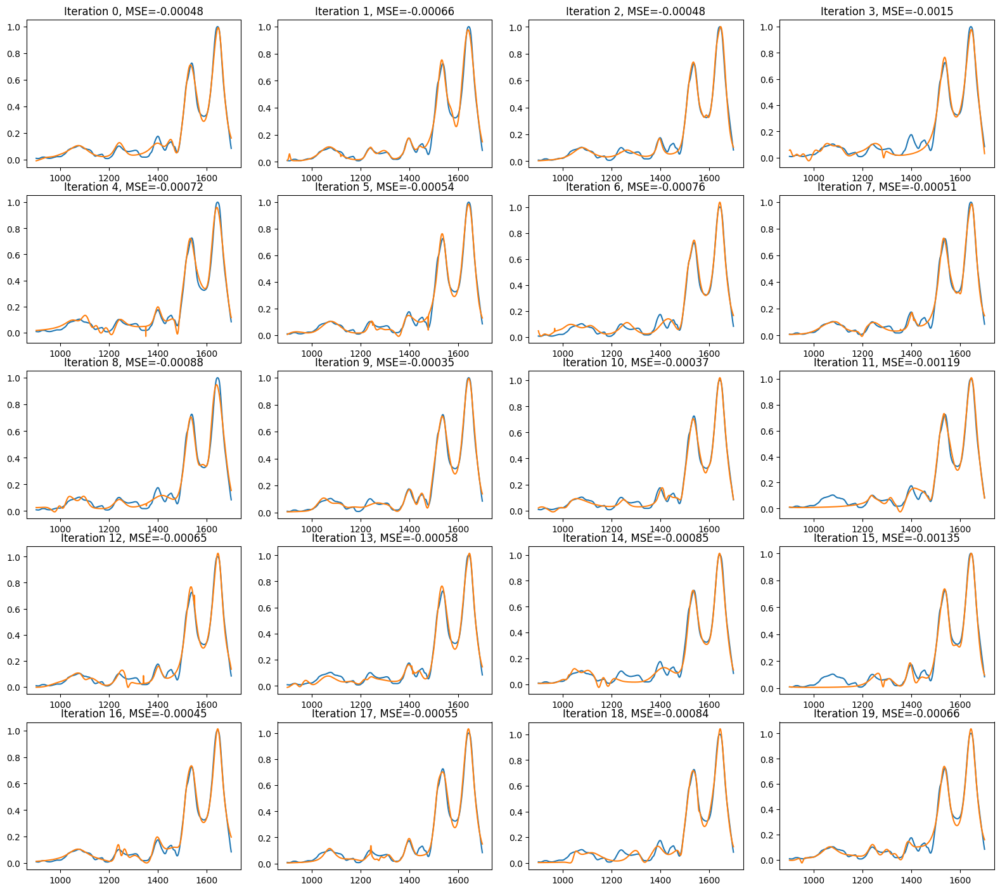

In [54]:
# 15 peaks
import matplotlib.pyplot as plt
# 20 запусков алгоритма при POP_SIZE = 120, N_GEN = 250, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15

fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(16, 14))
fig.tight_layout()
m = 0
for i in range(5):
    for j in range(4):
        optim_curve = get_voigt_from_chromosome(params_real[m], TARGET_X, NUM_PEAKS)
        ax[i, j].plot(TARGET_X, data, label='true')
        ax[i, j].plot(TARGET_X, optim_curve, label='optimization')
        ax[i, j].set_title(f'Iteration {m}, MSE={round(MSEs_real[m], 5)}', fontsize=12)
        #ax.legend()
        m = m + 1
#plt.legend()
#fig.suptitle('20 запусков алгоритма при POP_SIZE = 100, N_GEN = 300, MUT_RATE = 0.08, TOURN = 24, NUM_PEAKS = 15')
plt.show()

NameError: name 'histories' is not defined

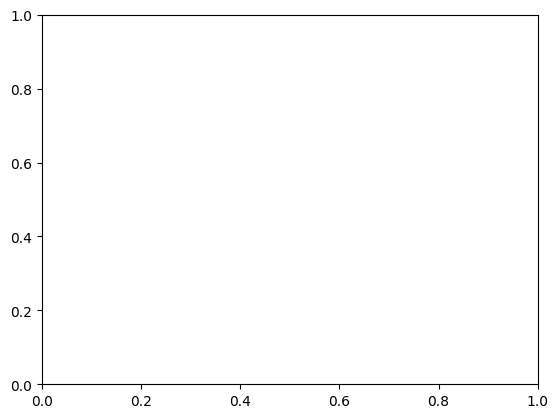

In [53]:
fig, ax = plt.subplots() 
for i in range(20):
    ax.plot(range(GENERATIONS), histories[i])
    ax.set_ylabel('- MSE')
    ax.set_xlabel('x')
plt.title('Кривые "обучения" ')
plt.show()